# OPTIONAL Workbook for Homework #8

You are welcome to work on a local version of a notebook and upload it for this assignment.

This workspace is here if you'd rather not have to install all necessary packages locally.

You can download any json files to your local computer to add them to your jekyll page.

To download, you can right-click on the file and hit download.  For example, with the following code:

```python
from vega_datasets import data
import altair as alt

source = data.cars()
source.rename(columns={"Miles_per_Gallon":"Miles per Gallon"}, 
              inplace=True)


chart = alt.Chart(source).mark_circle(size=60).encode(
    x='Horsepower',
    y='Miles per Gallon',
    color='Origin',
    tooltip=['Name', 'Origin', 'Horsepower', 'Miles per Gallon']
).interactive()

chart.properties(width='container').save("cars.json")
```

You can download from the side bar like this:

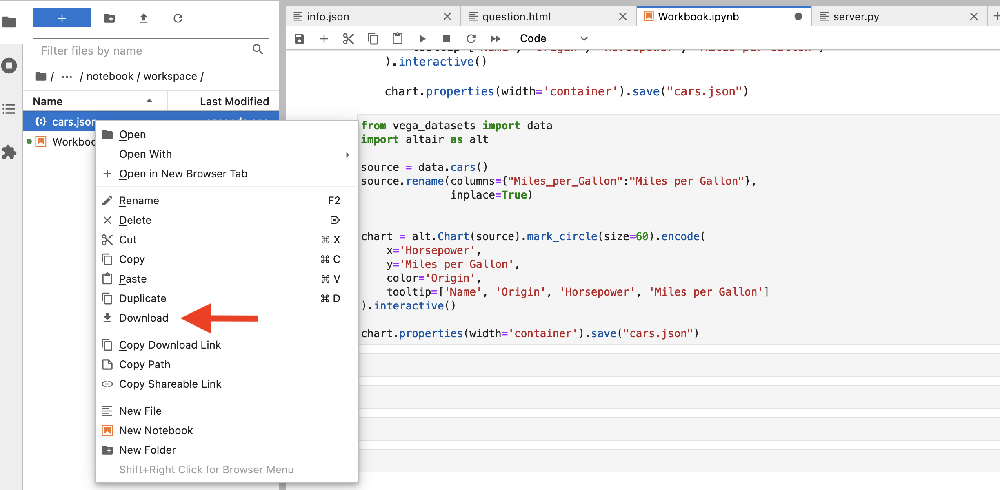

In [4]:
import pandas as pd
import altair as alt

alt.data_transformers.disable_max_rows()

url = "https://github.com/UIUC-iSchool-DataViz/is445_data/raw/main/licenses_fall2022.csv"

df = pd.read_csv(url)
df.head(10)

,_id,License Type,Description,License Number,License Status,Business,Title,First Name,Middle,Last Name,...,Specialty/Qualifier,Controlled Substance Schedule,Delegated Controlled Substance Schedule,Ever Disciplined,LastModifiedDate,Case Number,Action,Discipline Start Date,Discipline End Date,Discipline Reason
0,1189509,DETECTIVE BOARD,PERMANENT EMPLOYEE REGISTRATION,129446286,NOT RENEWED,N,NaN,EILEEN,NaN,SANTACRUZ,...,NaN,NaN,NaN,N,03/18/2022,NaN,NaN,NaN,NaN,NaN
1,801037,DETECTIVE BOARD,FIREARM CONTROL CARD,229030294.0,NOT RENEWED,N,NaN,DAGMAR,J,NORDLUND,...,NaN,NaN,NaN,N,08/16/2006,NaN,NaN,NaN,NaN,NaN
2,365129,COSMO,LICENSED COSMETOLOGIST,11053076.0,NOT RENEWED,N,NaN,RADOJE,NaN,ZELENOVIC,...,NaN,NaN,NaN,N,05/26/2006,NaN,NaN,NaN,NaN,NaN
3,595427,COSMO,LICENSED COSMETOLOGIST,11295645.0,ACTIVE,N,NaN,BECKY SUE,L,BURROUGHS,...,NaN,NaN,NaN,N,11/12/2021,NaN,NaN,NaN,NaN,NaN
4,653668,COSMO,LICENSED NAIL TECHNICIAN,169006247,NOT RENEWED,N,NaN,BILL G,L,LETNER,...,NaN,NaN,NaN,N,05/30/2006,NaN,NaN,NaN,NaN,NaN
5,584657,COSMO,LICENSED COSMETOLOGIST,11320085.0,NOT RENEWED,N,NaN,GARY,A,MAYBERRY,...,NaN,NaN,NaN,N,05/09/2022,NaN,NaN,NaN,NaN,NaN
6,418060,COSMO,LICENSED COSMETOLOGIST,11158187,NOT RENEWED,N,NaN,AUTUMN,NaN,HOLMAN,...,NaN,NaN,NaN,N,05/26/2006,NaN,NaN,NaN,NaN,NaN
7,797457,DETECTIVE BOARD,FIREARM CONTROL CARD,229042891.0,NOT RENEWED,N,NaN,KIMBERLY,NaN,EATON,...,NaN,NaN,NaN,N,01/19/2007,NaN,NaN,NaN,NaN,NaN
8,1139371,DETECTIVE BOARD,PERMANENT EMPLOYEE REGISTRATION,129335853,NOT RENEWED,N,NaN,YOUNJI,C,NAM,...,NaN,NaN,NaN,N,07/19/2018,NaN,NaN,NaN,NaN,NaN
9,1260977,FUNERAL AND EMBALMER,LICENSED FUNERAL DIRECTOR AND EMBALMER INTERN,033000179,CANCELLED,N,NaN,KATHY,NaN,HILTON,...,NaN,NaN,NaN,N,05/23/2006,NaN,NaN,NaN,NaN,NaN


In [5]:
df.shape

(10000, 31)

In [6]:
df.columns

Index(['_id', 'License Type', 'Description', 'License Number',
       'License Status', 'Business', 'Title', 'First Name', 'Middle',
       'Last Name', 'Prefix', 'Suffix', 'Business Name', 'BusinessDBA',
       'Original Issue Date', 'Effective Date', 'Expiration Date', 'City',
       'State', 'Zip', 'County', 'Specialty/Qualifier',
       'Controlled Substance Schedule',
       'Delegated Controlled Substance Schedule', 'Ever Disciplined',
       'LastModifiedDate', 'Case Number', 'Action', 'Discipline Start Date',
       'Discipline End Date', 'Discipline Reason'],
      dtype='object')

In [7]:
chart1 = alt.Chart(df).mark_bar().encode(
    x=alt.X("License Type:N", sort='-y'),
    y="count()",
    color="License Type:N"
).properties(
    title="Distribution of License Types"
)

chart1

alt.Chart(...)

In [11]:
#add dropdown
status_dropdown = alt.binding_select(options=df["License Status"].dropna().unique().tolist(),name="License Status: ")
#make a selection based on dropdown choice
status_select = alt.selection_point(fields=["License Status"],bind=status_dropdown)

chart2 = alt.Chart(df).mark_bar().encode(
    x=alt.X("License Type:N", sort="-y"),
    y=alt.Y("count():Q", title="Count of Records"),
    color=alt.Color("License Type:N")
).add_params(
    status_select
).transform_filter(
    status_select
).properties(
    title="License Type Distribution by Selected Status"
)

chart2

alt.Chart(...)

In [12]:
chart1.save("chart1.json")
chart2.save("chart2.json")